# Women E-Commerce Review Sentiment Analysis


---
### Load in and visualize the data

In [1]:
import pandas as pd

# read data from text files
review_df = pd.read_csv('Reviews.csv')
review_df

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...,...
23481,23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


In [2]:
review_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23486 entries, 0 to 23485
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Unnamed: 0               23486 non-null  int64 
 1   Clothing ID              23486 non-null  int64 
 2   Age                      23486 non-null  int64 
 3   Title                    19676 non-null  object
 4   Review Text              22641 non-null  object
 5   Rating                   23486 non-null  int64 
 6   Recommended IND          23486 non-null  int64 
 7   Positive Feedback Count  23486 non-null  int64 
 8   Division Name            23472 non-null  object
 9   Department Name          23472 non-null  object
 10  Class Name               23472 non-null  object
dtypes: int64(6), object(5)
memory usage: 2.0+ MB


In [3]:
review_df.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [4]:
review_df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


In [5]:
# checking for duplicated entries
duplicates = review_df.duplicated().sum()
if  duplicates == 0:
    print("There are no duplicted rows in this data")
else:
    print('There are: ', str(duplicates), " duplicates")

There are:  21  duplicates


In [6]:
review_df=review_df.drop_duplicates()

In [7]:
# checking for Null values
review_df["Review Text"].isnull().sum()

825

In [8]:
# drop Null values
review_df.dropna(subset=['Review Text'], inplace= True)

<ipython-input-8-36efb280ff8c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_df.dropna(subset=['Review Text'], inplace= True)


In [9]:
# Add text length column as a reference for padding length
review_df['Text_Length'] = review_df['Review Text'].apply(lambda x: len(x.split()))

<ipython-input-9-e3866eeeb61a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  review_df['Text_Length'] = review_df['Review Text'].apply(lambda x: len(x.split()))


In [10]:
review_df

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Text_Length
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,8
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,62
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,98
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,22
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,36
...,...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses,28
23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits,38
23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses,42
23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses,86


**Visualizing Data**

In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
import numpy as np

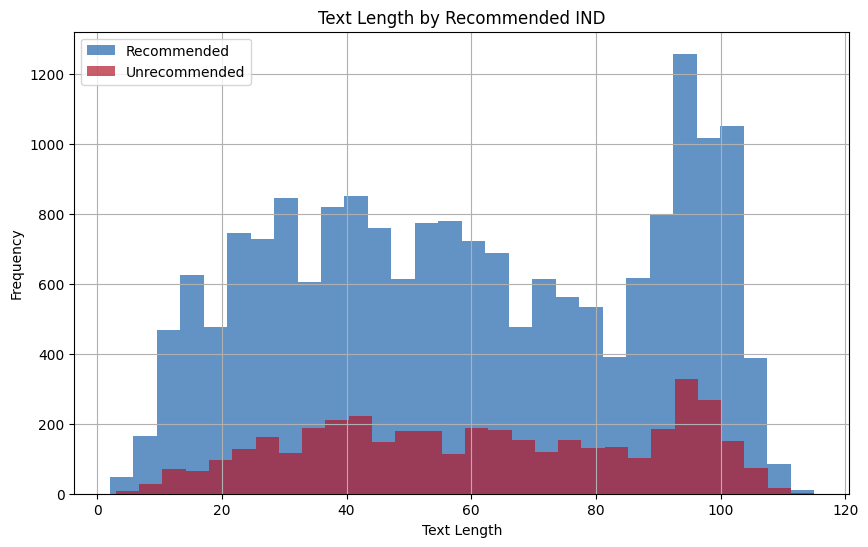

In [12]:
recommended = review_df[review_df['Recommended IND'] == 1]
recommended_n = review_df[review_df['Recommended IND']==0]

plt.figure(figsize=(10, 6))

plt.hist(recommended['Text_Length'], bins=30, alpha=0.7, label='Recommended', color='#2166ac')
plt.hist(recommended_n['Text_Length'], bins=30, alpha=0.7, label='Unrecommended', color='#b2182b')

plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.title('Text Length by Recommended IND')
plt.legend()

plt.grid(True)
plt.show()


In [13]:
recommended = review_df[review_df['Recommended IND'] == 1]
not_recommended = review_df[review_df['Recommended IND'] == 0]


bins = np.linspace(min(review_df['Text_Length']), max(review_df['Text_Length']), 30)


hist_data_recommended, _ = np.histogram(recommended['Text_Length'], bins=bins)
hist_data_not_recommended, _ = np.histogram(not_recommended['Text_Length'], bins=bins)


bin_midpoints = (bins[:-1] + bins[1:]) / 2
fig = go.Figure()

fig.add_trace(go.Bar(
    x=bin_midpoints,
    y=hist_data_recommended,
    name='Recommended',
    text=hist_data_recommended,
    textposition='auto',
    marker_color='#2166ac',
    hoverinfo='y+text'
))


fig.add_trace(go.Bar(
    x=bin_midpoints,
    y=hist_data_not_recommended,
    name='Not Recommended',
    text=hist_data_not_recommended,
    textposition='auto',
    marker_color='#b2182b',
    hoverinfo='y+text'
))

fig.update_layout(
    title='Text Length by Recommended IND',
    xaxis_title='Text Length',
    yaxis_title='Frequency',
    barmode='overlay',
    legend_title='Recommendation',
)

fig.show()


In [14]:
# The distribution of recommend and unrecommend text length is similar. There is a surge in around 100 words.
# This will be reference for padding length choice.

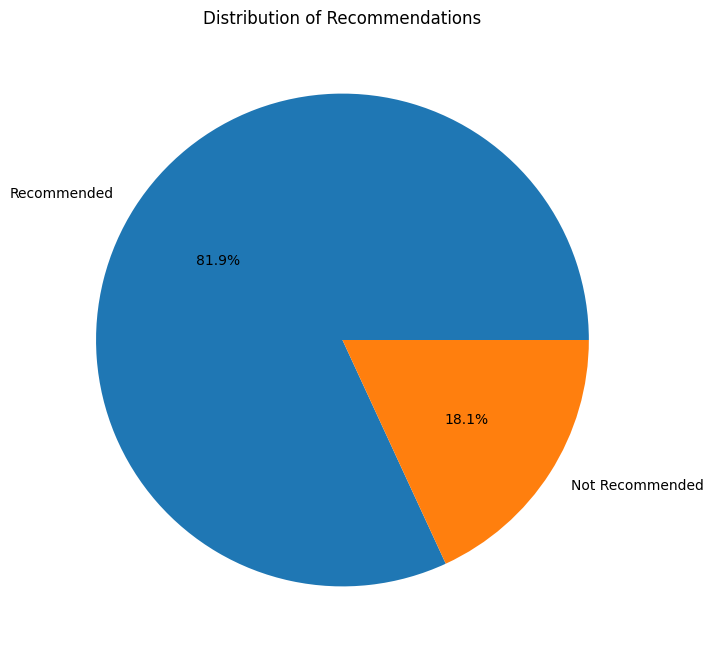

In [15]:


# Counting the values in the 'Recommended IND' column
recommended_counts = review_df['Recommended IND'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(recommended_counts, labels=['Recommended', 'Not Recommended'], autopct='%1.1f%%')
plt.title('Distribution of Recommendations')
plt.show()


In [16]:
recommended_counts = review_df['Recommended IND'].value_counts()

pie_fig = go.Figure(data=[
    go.Pie(
        labels=['Recommended', 'Not Recommended'],
        values=recommended_counts,
        marker=dict(colors=['#2166ac', '#b2182b']),
        textinfo='percent+label',
        hoverinfo='label+percent',
    )
])
pie_fig.update_layout(title='Distribution of Recommendations',)
pie_fig.show()

In [17]:
# Rating percentage, from 1 Worst, to 5 Best
rating_counts = review_df['Rating'].value_counts().sort_index()
total_ratings = rating_counts.sum()
rating_percentages = rating_counts / total_ratings
rating_fig = go.Figure()
rating_fig.add_trace(go.Bar(
    x=rating_counts.index,
    y=rating_counts.values,
    text=rating_percentages.apply(lambda x: '{:.1%}'.format(x)),
    textposition='outside',
    marker=dict(color='#2166ac')
))
rating_fig.update_layout(
    title='Distribution of Ratings',
    autosize=False,
    width=800,
    height=600,
    xaxis=dict(title='Rating'),
    yaxis=dict(title='Count'),
    margin=dict(l=100, r=100, b=50, t=100, pad=4)
)



In [19]:

classes = (
    review_df
    .groupby(['Recommended IND', 'Class Name'])
    .size()
    .to_frame()
    .rename(columns={0: 'Count'})
    .reset_index()
)
total_counts = classes.groupby('Class Name')['Count'].transform('sum')
classes['Percentage'] = classes['Count'].div(total_counts)
departments_pivot = classes.pivot(index='Class Name', columns='Recommended IND', values='Percentage')
departments_pivot = departments_pivot.fillna(0)
fig = go.Figure()

for col in departments_pivot.columns:
    fig.add_trace(go.Bar(
        y=departments_pivot.index,
        x=departments_pivot[col],
        name='Not Recommended' if col == 0 else 'Recommended',
        orientation='h',
        marker=dict(color='#b2182b' if col == 0 else '#2166ac'),
        text=departments_pivot[col].apply(lambda x: '{:.1%}'.format(x)),
        textposition='inside'
    ))


fig.update_layout(
    title='Distribution of <b>Class Name</b> by Recommendation',
    barmode='stack',
    autosize=False,
    width=680,
    height=800,
    margin=dict(l=150, r=100, b=30, t=100, pad=4),
    xaxis=dict(tickformat=',.0%'),
    showlegend=True
)



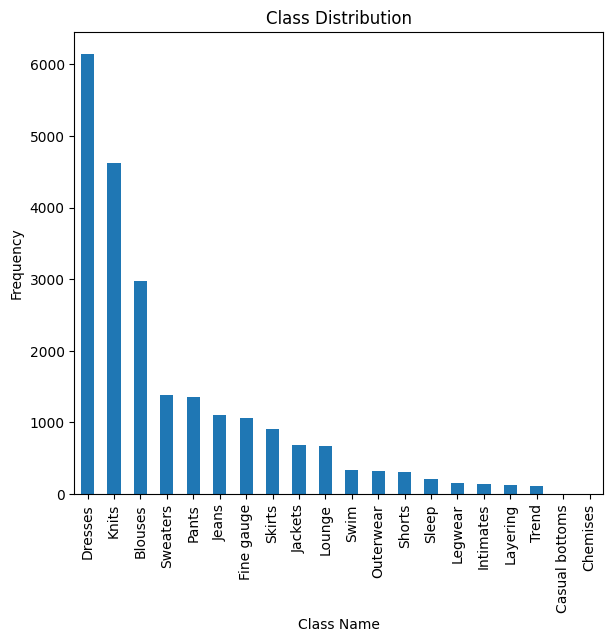

In [21]:
class_counts = review_df['Class Name'].value_counts()

# Create a figure with a size of 15x6 inches
plt.figure(figsize=(15, 6))

# Subplot 1: Class Distribution (Bar plot)
plt.subplot(1, 2, 1)
class_counts.plot(kind='bar')
plt.title('Class Distribution')
plt.xlabel('Class Name')
plt.ylabel('Frequency')

plt.show()

In [22]:
class_counts = review_df['Class Name'].value_counts()

fig = go.Figure(data=[
    go.Bar(
        x=class_counts.index,
        y=class_counts.values,
        marker_color='#2166ac'
    )
])

fig.update_layout(
    title='Class Distribution',
    xaxis=dict(
        title='Class Name',
        tickangle=-45
    ),
    yaxis=dict(
        title='Frequency'
    ),
    )

fig.show()


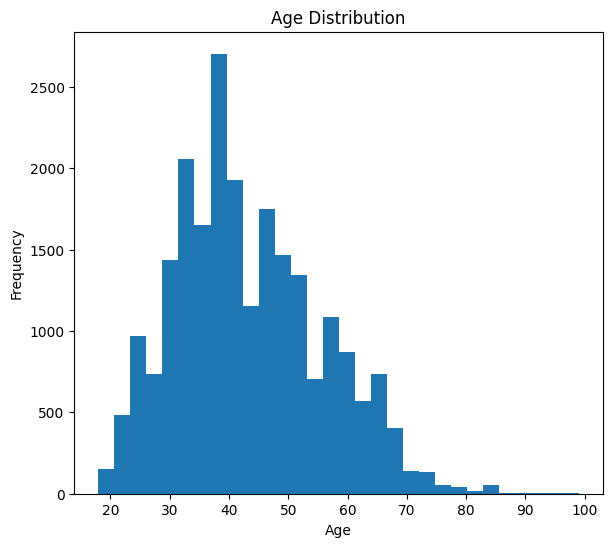

In [23]:
plt.figure(figsize=(15, 6))

# Subplot 1: Age Distribution
plt.subplot(1, 2, 1)
plt.hist(review_df['Age'], bins=30)  # Adjust the number of bins as needed
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')

plt.show()

In [24]:
hist_data, bin_edges = np.histogram(review_df['Age'], bins=30)

fig = go.Figure(data=[
    go.Bar(
        x=(bin_edges[:-1] + bin_edges[1:]) / 2,
        y=hist_data,
marker_color='#2166ac'
    )
])

fig.update_layout(
    title='Age Distribution',
    xaxis=dict(title='Age'),
    yaxis=dict(title='Frequency'),
    autosize=False,
    width=800,
    height=600
)
fig.show()


In [25]:
## Create new dataframe to calculate recommendation percentage for each age group of class category
age_ranges = [(20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70, 79)]
age_groups = ['20to29', '30to39', '40to49', '50to59', '60to69', '70to79']
for (start_age, end_age), age_group in zip(age_ranges, age_groups):
    review_df.loc[review_df['Age'].between(start_age, end_age, inclusive='right'), 'AgeGroup'] = age_group

recommendation_rates = review_df.groupby(['Class Name', 'AgeGroup'])['Recommended IND'].mean().reset_index()

grouped_data = recommendation_rates.pivot(index='Class Name', columns='AgeGroup', values='Recommended IND').fillna(0)


top_10_classes = review_df['Class Name'].value_counts().nlargest(10).index
grouped_data_top_10 = grouped_data.loc[top_10_classes]


fig = go.Figure()
for age_group in age_groups:
    fig.add_trace(go.Bar(
        x=grouped_data_top_10.index,
        y=grouped_data_top_10[age_group],
        name=age_group
    ))

fig.update_layout(
    barmode='group',
    title='Top 10 Classes by Age Group (Percentage Who Recommend)',
    xaxis_title='Class Name',
    yaxis=dict(
        title='Percentage Who Recommend',
        tickformat='.0%'
    ),
    legend_title='Age Group'
)

fig.show()

<ipython-input-25-7be23745424c>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
# add: 1. 不同年齡對class的推薦比例 2. 不同年齡買不同class的frequency

In [27]:
age_ranges = [(20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70, 79)]
age_groups = ['20to29', '30to39', '40to49', '50to59', '60to69', '70to79']

# Assign each review to an age group based on the customer's age
for (start_age, end_age), age_group in zip(age_ranges, age_groups):
    review_df.loc[review_df['Age'].between(start_age, end_age, inclusive='right'), 'AgeGroup'] = age_group

# Group by 'AgeGroup' and 'Class Name' and calculate the percentage of recommendations
age_class_rec = review_df.groupby(['AgeGroup', 'Department Name'])['Recommended IND'].agg(
    Recommendation_Rate=lambda x: x.sum() / x.count()).reset_index()

# Filter for the top 10 classes by number of reviews
top_classes = review_df['Department Name'].value_counts().nlargest(10).index
age_class_rec_top = age_class_rec[age_class_rec['Department Name'].isin(top_classes)]

# Pivot the DataFrame for the grouped bar chart
age_class_pivot = age_class_rec_top.pivot(index='AgeGroup', columns='Department Name', values='Recommendation_Rate').fillna(0)

# Create the grouped bar chart
fig = go.Figure()

# Add a bar for each class name within each age group
for class_name in top_classes:
    if class_name in age_class_pivot.columns:
        fig.add_trace(go.Bar(
            x=age_class_pivot.index,
            y=age_class_pivot[class_name] ,
            name=class_name
        ))

# Update the layout of the chart
fig.update_layout(
    barmode='group',
    title='Grouped Bar Chart of Recommendation Rate by Age Group for Department Name',
    xaxis_title='Age Group',
    yaxis=dict(
        title='Percentage Who Recommend (%)',
        tickformat='.0%'
    ),
    legend_title='Department Name'
)

# Show the plot
fig.show()

In [28]:
age_ranges = [(20, 29), (30, 39), (40, 49), (50, 59), (60, 69), (70, 79)]
age_groups = ['20to29', '30to39', '40to49', '50to59', '60to69', '70to79']

# Assign each review to an age group based on the customer's age
for (start_age, end_age), age_group in zip(age_ranges, age_groups):
    review_df.loc[review_df['Age'].between(start_age, end_age, inclusive='right'), 'AgeGroup'] = age_group

# Group by 'AgeGroup' and 'Class Name' and calculate the percentage of recommendations
age_class_rec = review_df.groupby(['AgeGroup', 'Class Name'])['Recommended IND'].agg(
    Recommendation_Rate=lambda x: x.sum() / x.count()).reset_index()

# Filter for the top 10 classes by number of reviews
top_classes = review_df['Class Name'].value_counts().nlargest(10).index
age_class_rec_top = age_class_rec[age_class_rec['Class Name'].isin(top_classes)]

# Pivot the DataFrame for the grouped bar chart
age_class_pivot = age_class_rec_top.pivot(index='AgeGroup', columns='Class Name', values='Recommendation_Rate').fillna(0)

# Create the grouped bar chart
fig = go.Figure()

# Add a bar for each class name within each age group
for class_name in top_classes:
    if class_name in age_class_pivot.columns:
        fig.add_trace(go.Bar(
            x=age_class_pivot.index,
            y=age_class_pivot[class_name] ,
            name=class_name
        ))

# Update the layout of the chart
fig.update_layout(
    barmode='group',
    title='Grouped Bar Chart of Recommendation Rate by Age Group for Top 10 Classes',
    xaxis_title='Age Group',
    yaxis=dict(
        title='Percentage Who Recommend (%)',
        tickformat='.0%'
    ),
    legend_title='Class Name'
)

# Show the plot
fig.show()


## Data pre-processing

The first step when building a neural network model is getting your data into the proper form to feed into the network. Since we're using embedding layers, we'll need to encode each word with an integer. We'll also want to clean it up a bit.

You can see an example of the reviews data above. Here are the processing steps, we'll want to take:
>* We'll want to get rid of periods and extraneous punctuation.
* Also, you might notice that the reviews are delimited with newline characters `\n`. To deal with those, I'm going to split the text into each review using `\n` as the delimiter.
* Then I can combined all the reviews back together into one big string.

First, let's remove all punctuation. Then get all the text without the newlines and split it into individual words.

In [29]:
reviews = review_df["Review Text"]

In [30]:
# ----- All text -------

import string
all_reviews_text = '\n'.join(str(review).replace('\n', ' ') for review in review_df['Review Text'].dropna())

# Removing punctuation
all_reviews_text_no_punct = all_reviews_text.translate(str.maketrans('', '', string.punctuation))

In [31]:
all_reviews_text_no_punct

'Absolutely wonderful  silky and sexy and comfortable\nLove this dress  its sooo pretty  i happened to find it in a store and im glad i did bc i never would have ordered it online bc its petite  i bought a petite and am 58  i love the length on me hits just a little below the knee  would definitely be a true midi on someone who is truly petite\nI had such high hopes for this dress and really wanted it to work for me i initially ordered the petite small my usual size but i found this to be outrageously small so small in fact that i could not zip it up i reordered it in petite medium which was just ok overall the top half was comfortable and fit nicely but the bottom half had a very tight under layer and several somewhat cheap net over layers imo a major design flaw was the net over layer sewn directly into the zipper  it c\nI love love love this jumpsuit its fun flirty and fabulous every time i wear it i get nothing but great compliments\nThis shirt is very flattering to all due to the 

In [32]:
print(all_reviews_text_no_punct[:1000])

Absolutely wonderful  silky and sexy and comfortable
Love this dress  its sooo pretty  i happened to find it in a store and im glad i did bc i never would have ordered it online bc its petite  i bought a petite and am 58  i love the length on me hits just a little below the knee  would definitely be a true midi on someone who is truly petite
I had such high hopes for this dress and really wanted it to work for me i initially ordered the petite small my usual size but i found this to be outrageously small so small in fact that i could not zip it up i reordered it in petite medium which was just ok overall the top half was comfortable and fit nicely but the bottom half had a very tight under layer and several somewhat cheap net over layers imo a major design flaw was the net over layer sewn directly into the zipper  it c
I love love love this jumpsuit its fun flirty and fabulous every time i wear it i get nothing but great compliments
This shirt is very flattering to all due to the adjus

In [33]:
all_reviews_text = '\n'.join(str(review).replace('\n', ' ') for review in review_df['Review Text'].dropna())

In [34]:
from string import punctuation
import numpy as np

print(punctuation)

# get rid of punctuation
all_reviews_text = all_reviews_text_no_punct.lower()
all_text = ''.join([c if c not in punctuation else ' ' for c in all_reviews_text])

# split by new lines and spaces
reviews_split = all_text.split('\n')
all_text = ' '.join(reviews_split)
# create a list of words
words = all_text.split()

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [35]:
len(reviews_split)

22640

In [36]:
words[:30]

['absolutely',
 'wonderful',
 'silky',
 'and',
 'sexy',
 'and',
 'comfortable',
 'love',
 'this',
 'dress',
 'its',
 'sooo',
 'pretty',
 'i',
 'happened',
 'to',
 'find',
 'it',
 'in',
 'a',
 'store',
 'and',
 'im',
 'glad',
 'i',
 'did',
 'bc',
 'i',
 'never',
 'would']

In [37]:
# ----- Recommended Text --------
high_rating = review_df[review_df['Rating'] == 5]
high_rating_reviews_text = '\n'.join(str(review).replace('\n', ' ') for review in high_rating['Review Text'].dropna())

# Removing punctuation
high_rating_reviews_text_no_punct = high_rating_reviews_text.translate(str.maketrans('', '', string.punctuation))

In [38]:
# ----- Unrecommended Text --------
low_rating = review_df[review_df['Rating'] ==1]
low_rating_reviews_text = '\n'.join(str(review).replace('\n', ' ') for review in low_rating['Review Text'].dropna())

# Removing punctuation
low_rating_reviews_text_no_punct = low_rating_reviews_text.translate(str.maketrans('', '', string.punctuation))

In [39]:
# Recommended & Unrecommended reviews

high_rating_text = high_rating_reviews_text_no_punct.lower()
high_rating_text = ''.join([c if c not in punctuation else ' ' for c in high_rating_text])

low_rating_text = low_rating_reviews_text_no_punct.lower()
low_rating_text = ''.join([c if c not in punctuation else ' ' for c in low_rating_text])

In [40]:
# Sweater reviews between 20 to 60 years old with low rating
trend_lowrating = review_df[(review_df['Rating'] < 3) & (review_df['Department Name'] == "Trend") & (review_df['Age'] >= 40) & (review_df['Age'] <= 60)]
trend_lowrating_reviews_text = '\n'.join(str(review).replace('\n', ' ') for review in trend_lowrating['Review Text'].dropna())

# Removing punctuation
trend_lowrating_text_no_punct = trend_lowrating_reviews_text.translate(str.maketrans('', '', string.punctuation))

trend_lowrating_text = trend_lowrating_text_no_punct.lower()
trend_lowrating_text = ''.join([c if c not in punctuation else ' ' for c in trend_lowrating_text])

In [41]:
trend_lowrating

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Text_Length,AgeGroup
4458,1145,51,Beyond boxy,I am not sure who would look good in this dres...,1,0,0,General,Trend,Trend,24,50to59
4788,1145,46,Perfect for a tent,This runs sooo big! i normally wear a large ( ...,1,0,2,General,Trend,Trend,94,40to49
11406,572,43,Cheaply made,I had loved this on-line when i saw the pretty...,1,0,4,General,Trend,Trend,32,40to49
11419,572,40,Flower sack,This dress was so pretty on the hanger but a s...,2,0,10,General,Trend,Trend,65,NaN
12294,569,46,"It's like a work of art, but sadly, not flatte...","It's like a work of art, but sadly, not flatte...",2,0,1,General,Trend,Trend,55,40to49
12303,569,58,Fly away sides,I waited a long time to get this top. unfortun...,2,0,7,General,Trend,Trend,69,50to59
12306,569,53,Pretty bad in real life,"When i unwrapped this a chemical ""stink"" hit m...",1,0,9,General,Trend,Trend,97,50to59
16084,1146,52,Disappointed,I have purchased a lot from retailer but latel...,1,0,3,General Petite,Trend,Trend,48,50to59
17647,1146,45,Wanted to love this...but,"This dress runs so large, why did they not mak...",2,1,0,General Petite,Trend,Trend,56,40to49
19188,1142,54,Neck,"The dress is pretty, i ordered a 4 and 6 not k...",1,0,1,General Petite,Trend,Trend,24,50to59


### Encoding the words

The embedding lookup requires that we pass in integers to our network. The easiest way to do this is to create dictionaries that map the words in the vocabulary to integers. Then we can convert each of our reviews into integers so they can be passed into the network.

> **Exercise:** Now you're going to encode the words with integers. Build a dictionary that maps words to integers. Later we're going to pad our input vectors with zeros, so make sure the integers **start at 1, not 0**.
> Also, convert the reviews to integers and store the reviews in a new list called `reviews_ints`.

In [42]:
from collections import Counter

## Build a dictionary that maps words to integers
counts = Counter(words)
vocab = sorted(counts, key=counts.get, reverse=True)
vocab_to_int = {words:i for i, words in enumerate(vocab, 1)}
#print(vocab_to_int)

## use the dict to tokenize each review in reviews_split
## store the tokenized reviews in reviews_ints (which is a list)
reviews_ints = []
for review in reviews_split:
    reviews_ints.append([vocab_to_int[word] for word in review.split()])

In [43]:
'''
from collections import Counter
import random

counts = Counter(words)
threshold = 1
total_count = len(words)
freqs = {word: count/total_count for word, count in counts.items()}
p_drop = {word: 1 - np.sqrt(threshold/freqs[word]) for word in counts}
vocab = sorted(counts, key=counts.get, reverse=True)
vocab_to_int = {words:i for i, words in enumerate(vocab, 1)}

reviews_ints = []
for review in reviews_split:
  for word in review.split():
    if random.random() < (1 - p_drop[word]):
      reviews_ints.append([vocab_to_int[word]])

'''

'\nfrom collections import Counter\nimport random\n\ncounts = Counter(words)\nthreshold = 1\ntotal_count = len(words)\nfreqs = {word: count/total_count for word, count in counts.items()}\np_drop = {word: 1 - np.sqrt(threshold/freqs[word]) for word in counts}\nvocab = sorted(counts, key=counts.get, reverse=True)\nvocab_to_int = {words:i for i, words in enumerate(vocab, 1)}\n\nreviews_ints = []\nfor review in reviews_split:\n  for word in review.split():\n    if random.random() < (1 - p_drop[word]):\n      reviews_ints.append([vocab_to_int[word]])\n\n'

In [44]:
# Tried subsampling but didn't get good result, maybe because there are less words in the vocabulary

**Test your code**

As a text that you've implemented the dictionary correctly, print out the number of unique words in your vocabulary and the contents of the first, tokenized review.

In [45]:
# stats about vocabulary
print('Unique words: ', len((vocab_to_int)))
print()

# print tokens in first review
print('Tokenized review: \n', reviews_ints[:1])

Unique words:  19372

Tokenized review: 
 [[248, 524, 908, 3, 655, 3, 67]]


### Encoding the labels

Our labels are "positive" or "negative". To use these labels in our network, we need to convert them to 0 and 1.

Convert labels from `positive` and `negative` to 1 and 0, respectively, and place those in a new list, `encoded_labels`.

In [46]:
# Rating labels
encoded_labels = np.array(review_df['Rating'])-1

In [47]:
encoded_labels.min()

0

In [48]:
encoded_labels.dtype

dtype('int64')

In [49]:
len(encoded_labels)

22640


### Padding sequences



In [50]:
def pad_features(reviews_ints, seq_length):
    ''' Return features of review_ints, where each review is padded with 0's
        or truncated to the input seq_length.
    '''

    # getting the correct rows x cols shape
    features = np.zeros((len(reviews_ints), seq_length), dtype=int)

    # for each review, I grab that review and
    for i, row in enumerate(reviews_ints):
        features[i, -len(row):] = np.array(row)[:seq_length]

    return features

In [51]:
# Test your implementation!

seq_length = 100

features = pad_features(reviews_ints, seq_length=seq_length)

## test statements - do not change - ##
assert len(features)==len(reviews_ints), "Your features should have as many rows as reviews."
assert len(features[0])==seq_length, "Each feature row should contain seq_length values."

# print first 10 values of the first 30 batches
print(features[:30,:10])

[[   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    2   65  306  194 1080   12    7]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    2   21 1963 1964  239   10    7   57]
 [   0    2 9116    7    9   17 3051   43 1360  458]
 [   0    0    0    2   52    7    9 2937   12  109]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0   51]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    7    6    4   69 1113]
 [   0    0    0    0    0    0    2  388   56   61]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0    0    0

## Training, Validation, Test

With our data in nice shape, we'll split it into training, validation, and test sets.

> Create the training, validation, and test sets.
* You'll need to create sets for the features and the labels, `train_x` and `train_y`, for example.
* Define a split fraction, `split_frac` as the fraction of data to **keep** in the training set. Usually this is set to 0.8 or 0.9.
* Whatever data is left will be split in half to create the validation and *testing* data.

In [52]:
split_frac = 0.8

## split data into training, validation, and test data (features and labels, x and y)

split_idx = int(len(features)*split_frac)
train_x, remaining_x = features[:split_idx], features[split_idx:]
train_y, remaining_y = encoded_labels[:split_idx], encoded_labels[split_idx:]

test_idx = int(len(remaining_x)*0.5)
val_x, test_x = remaining_x[:test_idx], remaining_x[test_idx:]
val_y, test_y = remaining_y[:test_idx], remaining_y[test_idx:]

## print out the shapes of your resultant feature data
print("\t\t\tFeature Shapes:")
print("Train set: \t\t{}".format(train_x.shape),
      "\nValidation set: \t{}".format(val_x.shape),
      "\nTest set: \t\t{}".format(test_x.shape))

			Feature Shapes:
Train set: 		(18112, 100) 
Validation set: 	(2264, 100) 
Test set: 		(2264, 100)


# Baseline Model - Logistic Regression

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
lr = LogisticRegression()

# Fit the model on the training data
lr.fit(train_x, train_y)

# Predict on the validation set
pred_valid = lr.predict(val_x)

# Calculate accuracy on the validation set
accuracy_valid = accuracy_score(val_y, pred_valid)
print(f"Accuracy on validation set: {accuracy_valid * 100:.2f}%")

# Predict on the test set
pred_test = lr.predict(test_x)

# Calculate accuracy on the test set
accuracy_test = accuracy_score(test_y, pred_test)
print(f"Accuracy on test set: {accuracy_test * 100:.2f}%")

Accuracy on validation set: 52.74%
Accuracy on test set: 55.43%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



---
## DataLoaders and Batching


In [54]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# create Tensor datasets
train_data = TensorDataset(torch.from_numpy(train_x), torch.from_numpy(train_y))
valid_data = TensorDataset(torch.from_numpy(val_x), torch.from_numpy(val_y))
test_data = TensorDataset(torch.from_numpy(test_x), torch.from_numpy(test_y))

# dataloaders
batch_size = 100

# make sure SHUFFLE your training data
# drop_last=True will drop the last batch if the size is less than the given batch_size
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size,  drop_last=True)
valid_loader = DataLoader(valid_data, shuffle=True, batch_size=batch_size, drop_last=True)
test_loader = DataLoader(test_data, shuffle=True, batch_size=batch_size, drop_last=True)

In [55]:
# obtain one batch of training data
dataiter = iter(train_loader)
sample_x, sample_y = next(dataiter)

print('Sample input size: ', sample_x.size()) # batch_size, seq_length
print('Sample input: \n', sample_x)
print()
print('Sample label size: ', sample_y.size()) # batch_size
print('Sample label: \n', sample_y)

Sample input size:  torch.Size([100, 100])
Sample input: 
 tensor([[   0,    0,    0,  ...,  130,    8,   22],
        [   0,    0,    0,  ...,  452, 1009,   21],
        [   0,    0,    0,  ...,   91,    3,  320],
        ...,
        [   0,    0,    0,  ..., 4382,   13, 7357],
        [   0,    0,    0,  ...,   29,  169,   63],
        [   0,    0,    0,  ...,   12,   51,   92]])

Sample label size:  torch.Size([100])
Sample label: 
 tensor([2, 4, 3, 3, 4, 1, 1, 2, 4, 4, 2, 4, 4, 3, 4, 4, 4, 1, 4, 4, 4, 4, 2, 2,
        4, 4, 4, 4, 4, 3, 4, 1, 3, 4, 4, 4, 1, 4, 3, 4, 3, 4, 4, 4, 4, 2, 4, 3,
        4, 2, 4, 4, 2, 3, 4, 4, 4, 3, 4, 4, 4, 0, 1, 4, 4, 2, 4, 3, 4, 0, 4, 2,
        2, 4, 4, 4, 4, 1, 3, 2, 4, 4, 4, 4, 0, 4, 0, 4, 4, 4, 1, 4, 1, 0, 4, 4,
        3, 2, 0, 4])


In [56]:
# First checking if GPU is available
train_on_gpu=torch.cuda.is_available()

if(train_on_gpu):
    print('Training on GPU.')
else:
    print('No GPU available, training on CPU.')

Training on GPU.


# Sentiment Network (by Rating)

In [57]:
import torch.nn as nn

class SentimentRNN(nn.Module):
    """
    The RNN model that will be used to perform Sentiment analysis.
    """

    def __init__(self, vocab_size, output_size, embedding_dim, hidden_dim, n_layers, drop_prob=0.5):
        """
        Initialize the model by setting up the layers.
        """
        super(SentimentRNN, self).__init__()

        self.output_size = output_size
        self.n_layers = n_layers
        self.hidden_dim = hidden_dim

        # Add embedding and LSTM layers
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, n_layers, dropout=drop_prob, batch_first=True)

        # Dropout layer
        self.dropout = nn.Dropout(0.3)

        # Linear layer
        self.fc = nn.Linear(hidden_dim, output_size)


    def forward(self, x, hidden):
        """
        Perform a forward pass of our model on some input and hidden state.
        """
        batch_size = x.size(0)

        x = x.long()

        # Compute embeddings and lstm_out
        embeds = self.embedding(x)
        lstm_out, hidden = self.lstm(embeds, hidden)

        lstm_out = lstm_out[:, -1, :]  # Getting the last time step output

        # Dropout and fully-connected layer
        out = self.dropout(lstm_out)
        out = self.fc(out)

        # Return output and hidden state
        return out, hidden


    def init_hidden(self, batch_size):
        ''' Initializes hidden state '''
        # Create two new tensors with sizes n_layers x batch_size x hidden_dim,
        # initialized to zero, for hidden state and cell state of LSTM
        weight = next(self.parameters()).data

        hidden = (weight.new(self.n_layers, batch_size, self.hidden_dim).zero_(),
                  weight.new(self.n_layers, batch_size, self.hidden_dim).zero_())

        return hidden


## Instantiate the network

Here, we'll instantiate the network. First up, defining the hyperparameters.

* `vocab_size`: Size of our vocabulary or the range of values for our input, word tokens.
* `output_size`: Size of our desired output; the number of class scores we want to output (pos/neg).
* `embedding_dim`: Number of columns in the embedding lookup table; size of our embeddings.
* `hidden_dim`: Number of units in the hidden layers of our LSTM cells. Usually larger is better performance wise. Common values are 128, 256, 512, etc.
* `n_layers`: Number of LSTM layers in the network. Typically between 1-3

> Define the model  hyperparameters.


In [58]:
# Instantiate the model w/ hyperparams
vocab_size = len(vocab_to_int)+1 # +1 for the 0 padding + our word tokens
output_size = 5
embedding_dim = 100
hidden_dim = 256
n_layers = 2

net = SentimentRNN(vocab_size, output_size, embedding_dim, hidden_dim, n_layers)

print(net)

SentimentRNN(
  (embedding): Embedding(19373, 100)
  (lstm): LSTM(100, 256, num_layers=2, batch_first=True, dropout=0.5)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=256, out_features=5, bias=True)
)


---
## Training

Below is the typical training code. If you want to do this yourself, feel free to delete all this code and implement it yourself. You can also add code to save a model by name.

>We'll also be using a new kind of cross entropy loss, which is designed to work with a single Sigmoid output. [BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss), or **Binary Cross Entropy Loss**, applies cross entropy loss to a single value between 0 and 1.

We also have some data and training hyparameters:

* `lr`: Learning rate for our optimizer.
* `epochs`: Number of times to iterate through the training dataset.
* `clip`: The maximum gradient value to clip at (to prevent exploding gradients).

In [59]:
# loss and optimization functions
lr = 0.005
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=lr, weight_decay=1e-4)


**Exercise**: Fill in the missing code below to train and valid the model

Epoch: 1/7... Step: 50... Loss: 1.267205... Val Loss: 1.206933
Epoch: 1/7... Step: 100... Loss: 0.997084... Val Loss: 1.145680
Epoch: 1/7... Step: 150... Loss: 0.991195... Val Loss: 1.084863
Epoch: 2/7... Step: 200... Loss: 0.998959... Val Loss: 1.055899
Epoch: 2/7... Step: 250... Loss: 0.892537... Val Loss: 1.035684
Epoch: 2/7... Step: 300... Loss: 1.017064... Val Loss: 0.989632
Epoch: 2/7... Step: 350... Loss: 0.836216... Val Loss: 0.965387
Epoch: 3/7... Step: 400... Loss: 0.928406... Val Loss: 1.003121
Epoch: 3/7... Step: 450... Loss: 0.717190... Val Loss: 0.951384
Epoch: 3/7... Step: 500... Loss: 0.899596... Val Loss: 0.934367
Epoch: 4/7... Step: 550... Loss: 0.747145... Val Loss: 0.959081
Epoch: 4/7... Step: 600... Loss: 0.942934... Val Loss: 0.964024
Epoch: 4/7... Step: 650... Loss: 0.818263... Val Loss: 0.923032
Epoch: 4/7... Step: 700... Loss: 0.808265... Val Loss: 0.903321
Epoch: 5/7... Step: 750... Loss: 0.813650... Val Loss: 0.921335
Epoch: 5/7... Step: 800... Loss: 0.890227

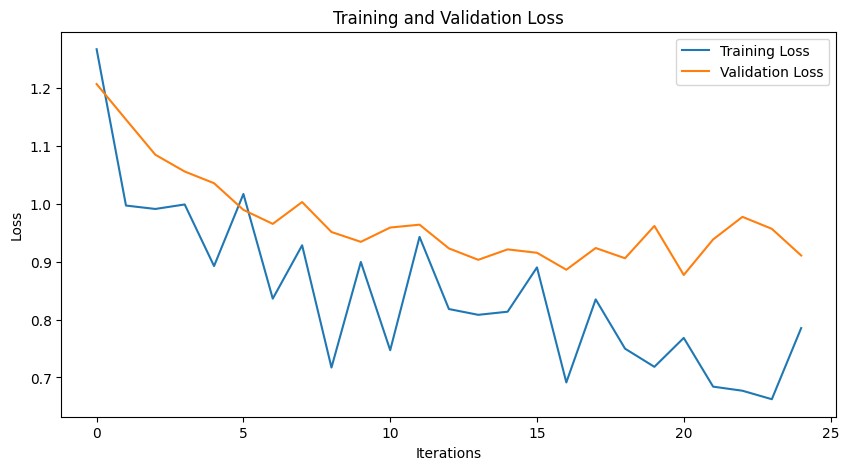

In [60]:
train_losses = []
val_losses = []

epochs = 7
counter = 0
print_every = 50
clip = 5  # gradient clipping

# Move model to GPU, if available
if train_on_gpu:
    net.cuda()

net.train()

# Train for some number of epochs
for e in range(epochs):
    # Initialize hidden state
    h = net.init_hidden(batch_size)

    # Batch loop
    for inputs, labels in train_loader:
        counter += 1

        if train_on_gpu:
            inputs, labels = inputs.cuda(), labels.cuda()

        # Creating new variables for the hidden state, otherwise
        # we'd backprop through the entire training history
        h = tuple([each.data for each in h])

        # Get the output from the model
        output, h = net(inputs, h)

        # Calculate the loss and perform backpropagation
        loss = criterion(output, labels.flatten())

        # Zero accumulated gradients
        net.zero_grad()

        # Backpropagation
        loss.backward()
        # `clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
        nn.utils.clip_grad_norm_(net.parameters(), clip)

        # Update weights
        optimizer.step()

        # Loss stats
        if counter % print_every == 0:
            # Get validation loss
            val_h = net.init_hidden(batch_size)
            tot_test_loss = 0
            net.eval()
            for inputs, labels in valid_loader:
                val_h = tuple([each.data for each in val_h])

                if train_on_gpu:
                    inputs, labels = inputs.cuda(), labels.cuda()

                output, val_h = net(inputs, val_h)
                val_loss = criterion(output, labels)
                tot_test_loss += val_loss.item()

            test_loss = tot_test_loss / len(valid_loader)

            net.train()

            # Print training and validation losses
            print("Epoch: {}/{}...".format(e + 1, epochs),
                  "Step: {}...".format(counter),
                  "Loss: {:.6f}...".format(loss.item()),
                  "Val Loss: {:.6f}".format(test_loss))

            # Append losses to the lists
            train_losses.append(loss.item())
            val_losses.append(test_loss)

# Plotting the training and validation losses
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


In [61]:
#Notes: change the padding length and add weight decay, also tune the learning rate and weight decay. Found out that with padding length = 150, epochs = 4, lr = 0.0005 and weight decay = 1e-4 has the best result of 62.5%
# padding length affects training when there are two many zeros or capture too less information.

**Note**: In the above training loop, we initialize hidden state after looping through all the batches of the training data. In this way, the hidden state computed for the previous batch is retained for the next batch. Therefore, to ensure the backpropagation work properly, we need to creating new variables for the hidden state:
        ```
        h = tuple([each.data for each in h])
        ```.

---
## Testing

There are a few ways to test your network.

* **Test data performance:** First, we'll see how our trained model performs on all of our defined test_data, above. We'll calculate the average loss and accuracy over the test data.

* **Inference on user-generated data:** Second, we'll see if we can input just one example review at a time (without a label), and see what the trained model predicts. Looking at new, user input data like this, and predicting an output label, is called **inference**.

In [62]:
# Get test data loss and accuracy

test_losses = [] # track loss
num_correct = 0

# init hidden state
h = net.init_hidden(batch_size)

net.eval()
# iterate over test data
for inputs, labels in test_loader:

    # Creating new variables for the hidden state, otherwise
    # we'd backprop through the entire training history
    h = tuple([each.data for each in h])

    if(train_on_gpu):
        inputs, labels = inputs.cuda(), labels.cuda().unsqueeze(1)

    # get predicted outputs
    output, h = net(inputs, h)

    # calculate loss
    test_loss = criterion(output, labels.flatten())
    test_losses.append(test_loss.item())

    # convert output probabilities to predicted class (0 or 1)
    # pred = torch.round(output.squeeze())  # rounds to the nearest integer
    pred = torch.argmax(output,dim = 1)

    # compare predictions to true label
    correct_tensor = pred.eq(labels.float().view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
    num_correct += np.sum(correct)


# -- stats! -- ##
# avg test loss
print("Test loss: {:.3f}".format(np.mean(test_losses)))

# accuracy over all test data
test_acc = num_correct/len(test_loader.dataset)
print("Test accuracy: {:.3f}".format(test_acc))

Test loss: 0.889
Test accuracy: 0.600


# Keyword Impact Analysis - Word Cloud

In [63]:
# Displaying the word frequency
word_frequency = Counter(words)

# Sorting words by frequency in descending order
sorted_word_frequency = dict(sorted(word_frequency.items(), key=lambda item: item[1], reverse=True))

# Displaying the sorted word frequency
for word, count in sorted_word_frequency.items():
  if count > len(reviews_split)*0.1 and count < len(reviews_split)*0.8:
    print(f'Word: {word} - Frequency: {count}')



Word: but - Frequency: 16392
Word: on - Frequency: 15181
Word: for - Frequency: 13986
Word: of - Frequency: 13420
Word: with - Frequency: 12780
Word: was - Frequency: 12216
Word: so - Frequency: 11899
Word: my - Frequency: 11013
Word: dress - Frequency: 10460
Word: not - Frequency: 9688
Word: that - Frequency: 9542
Word: love - Frequency: 8913
Word: size - Frequency: 8686
Word: very - Frequency: 8169
Word: have - Frequency: 8041
Word: top - Frequency: 7323
Word: are - Frequency: 7274
Word: fit - Frequency: 7237
Word: its - Frequency: 7173
Word: be - Frequency: 7023
Word: like - Frequency: 6991
Word: as - Frequency: 6688
Word: me - Frequency: 6650
Word: wear - Frequency: 6414
Word: great - Frequency: 6076
Word: too - Frequency: 6009
Word: im - Frequency: 5974
Word: or - Frequency: 5782
Word: am - Frequency: 5741
Word: just - Frequency: 5572
Word: you - Frequency: 5178
Word: would - Frequency: 5009
Word: they - Frequency: 4952
Word: at - Frequency: 4799
Word: fabric - Frequency: 4755
Wor

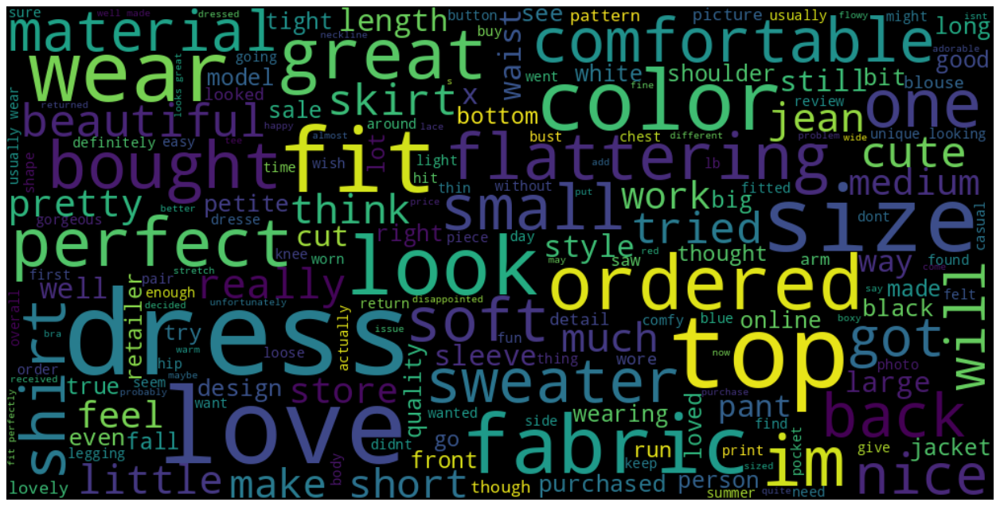

In [64]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordcloud_all = WordCloud(width = 1000,
                      height = 500,
                      random_state = 21,
                      max_font_size= 119).generate(all_text)
plt.figure(figsize = (20,20), dpi= 80)
plt.imshow(wordcloud_all, interpolation= 'bilinear')
plt.axis('off')
plt.show()

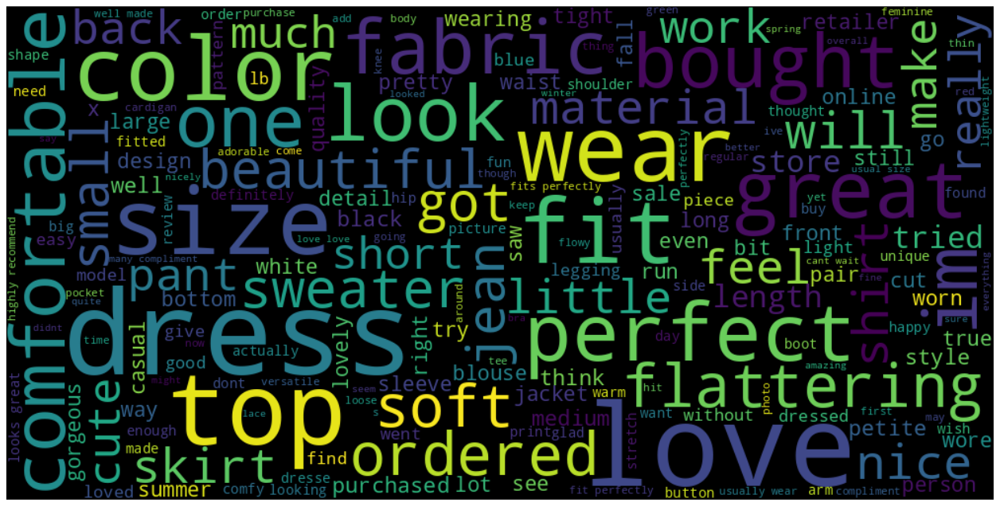

In [65]:
wordcloud_positive = WordCloud(width = 1000,
                      height = 500,
                      random_state = 21,
                      max_font_size= 119).generate(high_rating_text)
plt.figure(figsize = (20,20), dpi= 80)
plt.imshow(wordcloud_positive, interpolation= 'bilinear')
plt.axis('off')
plt.show()

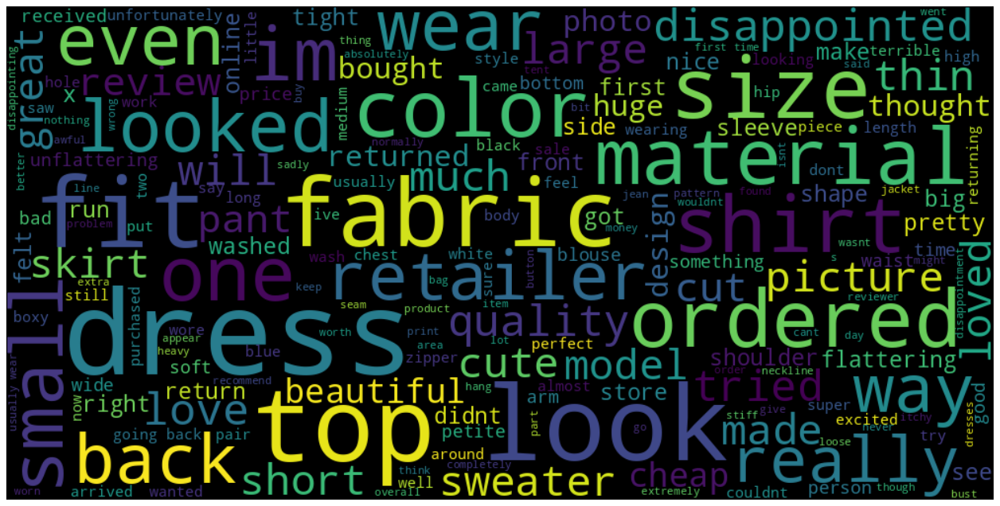

In [66]:
wordcloud_negative = WordCloud(width = 1000,
                      height = 500,
                      random_state = 21,
                      max_font_size= 119).generate(low_rating_text)
plt.figure(figsize = (20,20), dpi= 80)
plt.imshow(wordcloud_negative, interpolation= 'bilinear')
plt.axis('off')
plt.show()

In [67]:
trend_lowrating_text

'i am not sure who would look good in this dress it is extremely oversized with tons of fabric that will not flatter anyone\nthis runs sooo big i normally wear a large  145lb 54 36dd but due to the limited sizing small or medium i chose small because it looked big on the model and this style of dress seem to run large the size small that i ordered couldve fit two people easily together i loved the pattern color and the slip underneath actually fit well but i dont want to look like im wearing a tent lol also the back is slightly longer than the front something i couldnt see from the pictures online\ni had loved this online when i saw the pretty floral pattern however in person it is such a disappointment the quality of the fabric and the fit are just very poor\nthis dress was so pretty on the hanger but a saggy sack on even the sz 0 was too loose and shapeless there is no waist as pictured the hilow hem loose fit and wavy waist seam see in the third closeup picture make it look like the

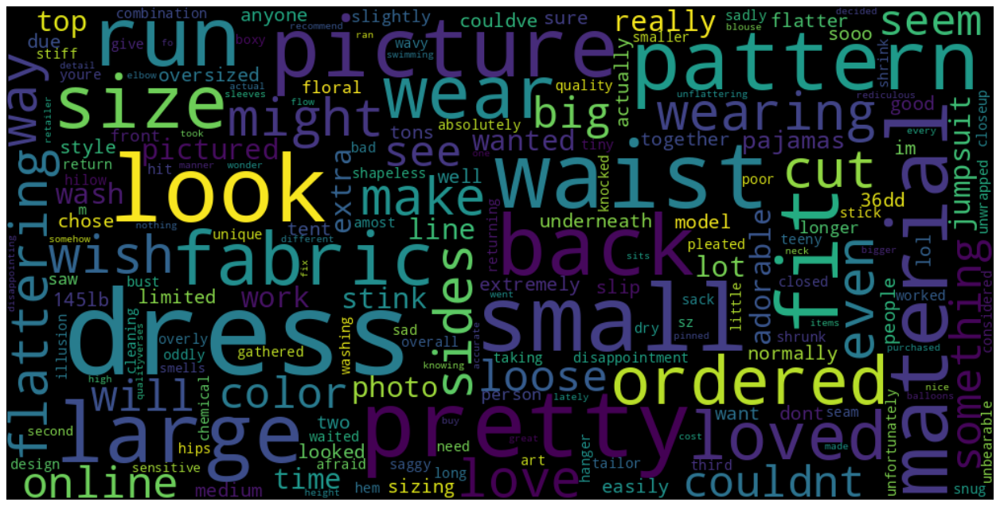

In [68]:
wordcloud_trend = WordCloud(width = 1000,
                      height = 500,
                      random_state = 21,
                      max_font_size= 119).generate(trend_lowrating_text)
plt.figure(figsize = (20,20), dpi= 80)
plt.imshow(wordcloud_trend, interpolation= 'bilinear', cmap='winter')
plt.axis('off')
plt.show()